In [68]:
import os
import json
import gzip
import pandas as pd
from urllib.request import urlopen

In [69]:
!wget http://deepyeti.ucsd.edu/jianmo/amazon/sample/Vehicles.json.gz

--2023-09-03 07:40:12--  http://deepyeti.ucsd.edu/jianmo/amazon/sample/Vehicles.json.gz
Resolving deepyeti.ucsd.edu (deepyeti.ucsd.edu)... 169.228.63.50
Connecting to deepyeti.ucsd.edu (deepyeti.ucsd.edu)|169.228.63.50|:80... connected.
HTTP request sent, awaiting response... 404 Not Found
2023-09-03 07:40:12 ERROR 404: Not Found.



In [70]:
import gzip
import json

data = []
with gzip.open('/content/Vehicles.json.gz', 'rt', encoding='utf-8') as f:
    for line in f:
        data.append(json.loads(line.strip()))

# Total de elementos en la lista (número total de productos)
print(len(data))

# Primer elemento de la lista
print(data[0])


60559
{'overall': 4.0, 'verified': False, 'reviewTime': '04 5, 2016', 'reviewerID': 'A2I67KXH6JJ04A', 'asin': 'B010CUA2W8', 'reviewerName': 'Len P', 'reviewText': 'Great truck.', 'summary': 'Four Stars', 'unixReviewTime': 1459814400}


In [71]:
# convert list into pandas dataframe

df = pd.DataFrame.from_dict(data)

print(len(df))

60559


In [72]:
df.columns

Index(['overall', 'verified', 'reviewTime', 'reviewerID', 'asin',
       'reviewerName', 'reviewText', 'summary', 'unixReviewTime', 'image',
       'vote', 'style'],
      dtype='object')

In [73]:
### remove rows with unformatted title (i.e. some 'title' may still contain html style content)

df3 = df.fillna('')

In [74]:
# how those unformatted rows look like
df3.iloc[0]

overall                      4.0
verified                   False
reviewTime            04 5, 2016
reviewerID        A2I67KXH6JJ04A
asin                  B010CUA2W8
reviewerName               Len P
reviewText          Great truck.
summary               Four Stars
unixReviewTime        1459814400
image                           
vote                            
style                           
Name: 0, dtype: object

In [75]:
# Suponiendo que df3 es tu DataFrame
min_overall = df3['overall'].min()
max_overall = df3['overall'].max()

print(f"El rango de valores en la columna 'overall' es de {min_overall} a {max_overall}")


El rango de valores en la columna 'overall' es de 1.0 a 5.0


In [76]:
# Suponiendo que df3 es tu DataFrame
valores_unicos_overall = df3['overall'].unique()

print("Valores únicos en la columna 'overall':")
print(valores_unicos_overall)
# Verificar si 3 está en la lista de valores únicos
if 3 in valores_unicos_overall:
    print("El valor 3 está presente en la columna 'overall'.")
else:
    print("El valor 3 no está presente en la columna 'overall'.")

Valores únicos en la columna 'overall':
[4. 5. 2. 1. 3.]
El valor 3 está presente en la columna 'overall'.


Reducion de unbalanced

```
# Tiene formato de código
```



In [77]:
import pandas as pd
filtered_df = df3[df3['overall'].isin([1, 2, 3, 4, 5])]

# Suponiendo que ya has definido filtered_df de la manera que lo hiciste
num_samples = len(df3)

sampled_df_1 = filtered_df[filtered_df['overall'] == 1]
sampled_df_2 = filtered_df[filtered_df['overall'] == 2]
sampled_df_3 = filtered_df[filtered_df['overall'] == 3]  # No hay necesidad de muestrear 3 ya que no se usa en el resultado final
print(sampled_df_3)
sampled_df_4 = filtered_df[filtered_df['overall'] == 4]
sampled_df_5 = filtered_df[filtered_df['overall'] == 5]

# Asegurémonos de que el tamaño de la muestra no sea mayor que la cantidad de datos disponibles en cada categoría
sampled_df_1 = sampled_df_1.sample(n=min(num_samples, len(sampled_df_1)))
sampled_df_2 = sampled_df_2.sample(n=min(num_samples, len(sampled_df_2)))
sampled_df_4 = sampled_df_4.sample(n=min(num_samples, len(sampled_df_4)))
sampled_df_5 = sampled_df_5.sample(n=min(num_samples, len(sampled_df_5)))

# Concatenamos los DataFrames de muestra en uno solo
result_df = pd.concat([sampled_df_1, sampled_df_2, sampled_df_3, sampled_df_4, sampled_df_5])

# Guardamos el resultado en un archivo CSV
result_df.to_csv('sampled_data_file.csv', index=False)


       overall  verified   reviewTime      reviewerID        asin  \
43         3.0     False   02 8, 2018  A3HS1GUY3YLWQ0  B010CUA2W8   
95         3.0     False   06 1, 2017  A2ED81971ID9LZ  B010CUA2W8   
119        3.0     False   06 1, 2017  A12K5TAWMZQF7H  B010CUA2W8   
152        3.0     False   06 1, 2017  A1C54BDSV1UQ7Z  B010CUA2W8   
231        3.0     False   05 4, 2016  A3D5JIGQDGWWKB  B010CUA2W8   
...        ...       ...          ...             ...         ...   
60350      3.0     False  01 13, 2017   AFNGFM5DC32E4  B01FRLZJK2   
60359      3.0     False   05 4, 2018   AM6BWA30ORB1V  B01FRM0ZB4   
60362      3.0     False   04 2, 2018  A2Q4K1AO9SNDU0  B01FRM0ZB4   
60375      3.0     False  05 15, 2017  A3A8RS7IJ38F2D  B01FRM1HCU   
60468      3.0     False  09 15, 2018  A3TBG4YLEVM2ZZ  B01H8DUCHC   

           reviewerName                                         reviewText  \
43         Danita Lloyd  I went to have keys programmed at Ford Dealers...   
95            D

In [78]:
len(result_df)

60559

In [79]:
import pandas as pd
sampled_data = pd.read_csv('sampled_data_file.csv')

# Imprimir el número de instancias en cada clase de la columna "overall"
class_counts = sampled_data['overall'].value_counts()
print("Número de instancias en cada clase:")
print(class_counts)


Número de instancias en cada clase:
5.0    43610
4.0    11300
3.0     2783
1.0     1716
2.0     1150
Name: overall, dtype: int64


Estos son datos no balanceados los cuales no se modificaran.

In [80]:
sampled_data.head()

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,image,vote,style
0,1.0,False,"12 9, 2017",ANOBWCG45UGO2,B010S4KX68,ChrisTornado,Wrong picture.... But great van!,Wrong picture,1512777600,NaN,NaN,NaN
1,1.0,False,"05 3, 2018",AMU4DSZONR1SM,B011DNQ4A2,stewart lang,This product is nothing like what it is descri...,One Star,1525305600,NaN,NaN,NaN
2,1.0,False,"04 21, 2016",A38EVP7E6LGCLI,B011BV6T24,NIEVES,limited dealership network....BUT lack of afte...,"not a bad car, not a great one",1461196800,NaN,NaN,NaN
3,1.0,False,"08 9, 2018",A1SGDW5YXRSGOH,B01CEB9AQM,Amazon Customer,Defective,Very disappointed,1533772800,NaN,NaN,NaN
4,1.0,False,"06 1, 2017",AYRUZO3HE7CON,B011AIWRFG,Seve K,nothing but problems,One Star,1496275200,NaN,NaN,NaN


In [81]:
valores_unicos_overall_sampled_data = sampled_data['overall'].unique()

print("Valores únicos en la columna 'overall':")
print(valores_unicos_overall_sampled_data)

Valores únicos en la columna 'overall':
[1. 2. 3. 4. 5.]


En este caso la clase mayoritaria puede dominar el modelo , eso nos podria dar una clasificacion deficiente. Otro posible problema seria un sobre ajuste a  4 y 5.

In [82]:
sampled_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60559 entries, 0 to 60558
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   overall         60559 non-null  float64
 1   verified        60559 non-null  bool   
 2   reviewTime      60559 non-null  object 
 3   reviewerID      60559 non-null  object 
 4   asin            60559 non-null  object 
 5   reviewerName    60555 non-null  object 
 6   reviewText      60061 non-null  object 
 7   summary         60533 non-null  object 
 8   unixReviewTime  60559 non-null  int64  
 9   image           6345 non-null   object 
 10  vote            4809 non-null   float64
 11  style           99 non-null     object 
dtypes: bool(1), float64(2), int64(1), object(8)
memory usage: 5.1+ MB


In [83]:
# Contar la cantidad de valores nulos en cada columna
nulos_por_columna = sampled_data.isnull().sum()

# Mostrar los resultados
print("Cantidad de valores nulos por columna:")
print(nulos_por_columna)

Cantidad de valores nulos por columna:
overall               0
verified              0
reviewTime            0
reviewerID            0
asin                  0
reviewerName          4
reviewText          498
summary              26
unixReviewTime        0
image             54214
vote              55750
style             60460
dtype: int64


No aporta informacion los datos de las columnas image, vote, style asi que eliminaremos esas columnas. Asi como eliminaremos los nan de reviewerName, reviewText y summary          

In [84]:
# Eliminar las columnas "image", "vote" y "style"
sampled_data = sampled_data.drop(columns=["image", "vote", "style"])

# Eliminar filas con valores nulos en las columnas "reviewerName", "reviewText" y "summary"
sampled_data = sampled_data.dropna(subset=["reviewerName", "reviewText", "summary"])

# Verificar el DataFrame resultante
print(sampled_data.head())

   overall  verified   reviewTime      reviewerID        asin  \
0      1.0     False   12 9, 2017   ANOBWCG45UGO2  B010S4KX68   
1      1.0     False   05 3, 2018   AMU4DSZONR1SM  B011DNQ4A2   
2      1.0     False  04 21, 2016  A38EVP7E6LGCLI  B011BV6T24   
3      1.0     False   08 9, 2018  A1SGDW5YXRSGOH  B01CEB9AQM   
4      1.0     False   06 1, 2017   AYRUZO3HE7CON  B011AIWRFG   

      reviewerName                                         reviewText  \
0     ChrisTornado                   Wrong picture.... But great van!   
1     stewart lang  This product is nothing like what it is descri...   
2           NIEVES  limited dealership network....BUT lack of afte...   
3  Amazon Customer                                          Defective   
4           Seve K                               nothing but problems   

                          summary  unixReviewTime  
0                   Wrong picture      1512777600  
1                        One Star      1525305600  
2  not a bad c

In [85]:
# Contar la cantidad de valores nulos en cada columna
nulos_por_columna = sampled_data.isnull().sum()

# Mostrar los resultados
print("Cantidad de valores nulos por columna:")
print(nulos_por_columna)

Cantidad de valores nulos por columna:
overall           0
verified          0
reviewTime        0
reviewerID        0
asin              0
reviewerName      0
reviewText        0
summary           0
unixReviewTime    0
dtype: int64


In [86]:
sampled_data.head()

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime
0,1.0,False,"12 9, 2017",ANOBWCG45UGO2,B010S4KX68,ChrisTornado,Wrong picture.... But great van!,Wrong picture,1512777600
1,1.0,False,"05 3, 2018",AMU4DSZONR1SM,B011DNQ4A2,stewart lang,This product is nothing like what it is descri...,One Star,1525305600
2,1.0,False,"04 21, 2016",A38EVP7E6LGCLI,B011BV6T24,NIEVES,limited dealership network....BUT lack of afte...,"not a bad car, not a great one",1461196800
3,1.0,False,"08 9, 2018",A1SGDW5YXRSGOH,B01CEB9AQM,Amazon Customer,Defective,Very disappointed,1533772800
4,1.0,False,"06 1, 2017",AYRUZO3HE7CON,B011AIWRFG,Seve K,nothing but problems,One Star,1496275200


In [87]:
sampled_data.columns

Index(['overall', 'verified', 'reviewTime', 'reviewerID', 'asin',
       'reviewerName', 'reviewText', 'summary', 'unixReviewTime'],
      dtype='object')

In [88]:
sampled_data['reviewTime'] = pd.to_datetime(sampled_data['reviewTime'], format='%m %d, %Y')

# Calcular la frecuencia de las fechas
frecuencia_reviewTime = sampled_data['reviewTime'].value_counts().sort_index()

# Mostrar las fechas y sus frecuencias
print("Frecuencia de fechas en la columna 'reviewTime':")
print(frecuencia_reviewTime)

Frecuencia de fechas en la columna 'reviewTime':
2016-02-09    1
2016-02-10    3
2016-02-11    4
2016-02-12    6
2016-02-13    5
             ..
2018-09-15    1
2018-09-21    1
2018-09-25    1
2018-09-27    1
2018-10-01    2
Name: reviewTime, Length: 946, dtype: int64


<ipython-input-88-89cee57a2626>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sampled_data['reviewTime'] = pd.to_datetime(sampled_data['reviewTime'], format='%m %d, %Y')


In [89]:
# Iterar a través de todas las columnas y calcular las frecuencias
for columna in sampled_data.columns:
    # Calcular la frecuencia de cada valor único en la columna actual
    frecuencia_columna = sampled_data[columna].value_counts()

    # Mostrar los valores únicos y sus frecuencias
    print(f"Valores únicos en la columna '{columna}' y su frecuencia:")
    print(frecuencia_columna)
    print("\n")  # Agregar una línea en blanco entre cada columna para mayor claridad

Valores únicos en la columna 'overall' y su frecuencia:
5.0    43177
4.0    11227
3.0     2772
1.0     1710
2.0     1149
Name: overall, dtype: int64


Valores únicos en la columna 'verified' y su frecuencia:
False    59952
True        83
Name: verified, dtype: int64


Valores únicos en la columna 'reviewTime' y su frecuencia:
2017-06-01    9974
2016-04-18    3111
2016-04-27    1747
2016-04-12    1489
2016-04-08    1458
              ... 
2018-09-03       1
2018-09-04       1
2016-03-04       1
2018-09-15       1
2018-09-10       1
Name: reviewTime, Length: 946, dtype: int64


Valores únicos en la columna 'reviewerID' y su frecuencia:
A15H87XBHZZ9XS    7
A1AWUNV3U27Y3J    6
A1L6VB4KK6TLQK    6
A24HXFMXN36ATF    6
AYIYJDVXACFH4     5
                 ..
A3FNFWQNUYP9P9    1
A32DJXWJT1JNHC    1
A1GODUDV4X8HIM    1
A1DUNMES4RVBBN    1
AHJKYMDZU6IAX     1
Name: reviewerID, Length: 58877, dtype: int64


Valores únicos en la columna 'asin' y su frecuencia:
B011EGN0M8    394
B011EIHX2E    343
B

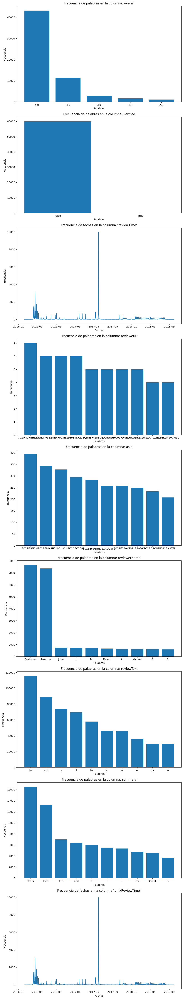

In [90]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

columnas_a_analizar = sampled_data.columns

# Configurar la disposición de los subplots
num_filas = len(columnas_a_analizar)
num_columnas = 1

# Crear una figura con subplots
fig, axs = plt.subplots(num_filas, num_columnas, figsize=(10, 6 * num_filas))

# Recorrer las columnas y generar los gráficos de frecuencia de palabras o fechas
for i, columna in enumerate(columnas_a_analizar):
    if columna in ['reviewTime', 'unixReviewTime']:
        # Convertir la columna "reviewTime" al tipo de datos datetime
        if columna =='reviewTime':
          sampled_data[columna] = pd.to_datetime(sampled_data[columna], format='%m %d, %Y')
        else:
          sampled_data[columna] = pd.to_datetime(sampled_data['unixReviewTime'], unit='s')
        # Calcular la frecuencia de las fechas
        frecuencia_reviewTime = sampled_data[columna].value_counts().sort_index()

        # Mostrar las fechas y sus frecuencias
        axs[i].plot(frecuencia_reviewTime.index, frecuencia_reviewTime.values)
        axs[i].set_title('Frecuencia de fechas en la columna "{}"'.format(columna))
        axs[i].set_xlabel('Fechas')
        axs[i].set_ylabel('Frecuencia')
    else:
        # Obtener el texto de la columna y unirlo en una cadena
        texto_completo = ' '.join(sampled_data[columna].astype(str))

        # Separar el texto en palabras y contar la frecuencia de cada palabra
        palabras = texto_completo.split()
        frecuencia_palabras = Counter(palabras)

        # Obtener las palabras más frecuentes y sus frecuencias
        palabras_mas_frecuentes = [palabra[0] for palabra in frecuencia_palabras.most_common(10)]
        frecuencias_mas_frecuentes = [frecuencia_palabras[palabra] for palabra in palabras_mas_frecuentes]

        # Crear un gráfico de barras para la frecuencia de palabras
        axs[i].bar(palabras_mas_frecuentes, frecuencias_mas_frecuentes)
        axs[i].set_title(f'Frecuencia de palabras en la columna: {columna}')
        axs[i].set_xlabel('Palabras')
        axs[i].set_ylabel('Frecuencia')

# Ajustar la disposición de los subplots
plt.tight_layout()

# Mostrar los gráficos
plt.show()


En este punto estamos viendo visualmente la distribucion de overall que como se ha dicho esta desvalanceado. Verified a false en la mayoria de los caso no aporta informacion util. Se ha revisado temporalmente las fechas de revision y unixReviewTime donde la mayor carga esta entre 2017-06 y el resto son picos menores. Sobre todo durante el verano en cada ano. Se puede observar que varios usuarios reviewer son activos y pueden tener hasta 7 participaciones. Ademas se representa la distribucion de asin zy revierName donse se puede ver los 10 mas importantes. La palabras del reviewText solo son palabre de union de oraciones que no esta relacionado con el tema aunque por otro lado en summary se relaciona con el overall con palabras stars, five, etc. Seguramente en el resumen tenemos lo mismo que reviewText y por eso selecionamos reviewText y overall para realizar una clasificacion binaria 4 y 5 estrellas sera positivo y del 1 al 3 negativo.

Con toda esta informacion nos quedamos con overrall y reviewText. Ademas agregare un label para los valores de overall 4 y 5 en una nueva columna binaria con valor 1 en los otros casos 0.

In [91]:
# Mantener solo las columnas 'overall' y 'reviewText'
sampled_data = sampled_data[['overall', 'reviewText']]

# Crear una nueva columna llamada 'binaria' en sampled_data
sampled_data['binaria'] = (sampled_data['overall'] == 5) | (sampled_data['overall'] == 4)

# Convertir los valores booleanos True/False en 1 y 0
sampled_data['binaria'] = sampled_data['binaria'].astype(int)

# Verificar el resultado
print(sampled_data[['overall', 'reviewText', 'binaria']].head())
sampled_data.to_csv('data_file.csv', index=False)



<ipython-input-91-4bae869f2683>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sampled_data['binaria'] = (sampled_data['overall'] == 5) | (sampled_data['overall'] == 4)
<ipython-input-91-4bae869f2683>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sampled_data['binaria'] = sampled_data['binaria'].astype(int)


   overall                                         reviewText  binaria
0      1.0                   Wrong picture.... But great van!        0
1      1.0  This product is nothing like what it is descri...        0
2      1.0  limited dealership network....BUT lack of afte...        0
3      1.0                                          Defective        0
4      1.0                               nothing but problems        0


In [92]:
sampled_data.head()

,overall,reviewText,binaria
0,1.0,Wrong picture.... But great van!,0
1,1.0,This product is nothing like what it is descri...,0
2,1.0,limited dealership network....BUT lack of afte...,0
3,1.0,Defective,0
4,1.0,nothing but problems,0


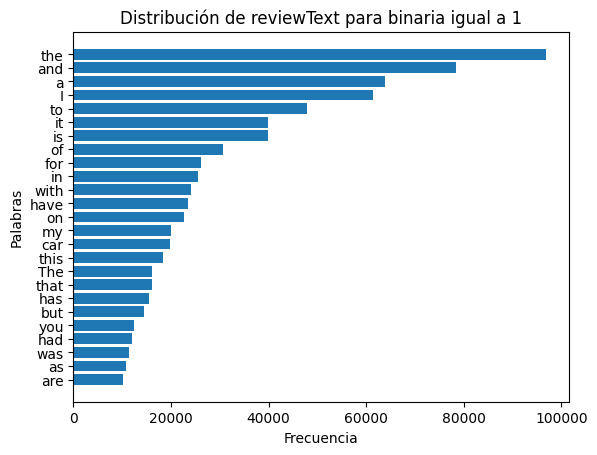

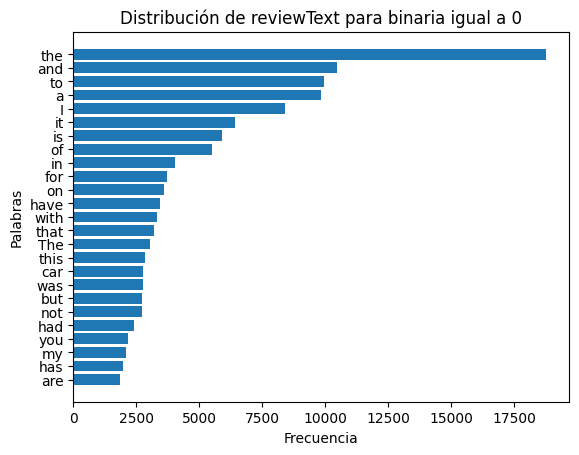

In [93]:
# Crear dos grupos basados en la columna 'binaria' (1 y 0)
grupo_binaria_1 = sampled_data[sampled_data['binaria'] == 1]
grupo_binaria_0 = sampled_data[sampled_data['binaria'] == 0]
# Función para generar gráficos de frecuencia de palabras
def plot_frecuencia_palabras(dataframe, title):
    texto_completo = ' '.join(dataframe['reviewText'].astype(str))
    palabras = texto_completo.split()
    frecuencia_palabras = Counter(palabras)

    # Obtener las palabras más frecuentes y sus frecuencias
    palabras_mas_frecuentes = [palabra[0] for palabra in frecuencia_palabras.most_common(25)]
    frecuencias_mas_frecuentes = [frecuencia_palabras[palabra] for palabra in palabras_mas_frecuentes]

    # Crear un gráfico de barras para la frecuencia de palabras en reviewText
    plt.barh(palabras_mas_frecuentes, frecuencias_mas_frecuentes)
    plt.title(title)
    plt.xlabel('Frecuencia')
    plt.ylabel('Palabras')
    plt.gca().invert_yaxis()  # Invertir el eje y para mostrar las palabras más frecuentes en la parte superior
    plt.show()

# Mostrar la distribución de reviewText para el grupo con binaria igual a 1
plot_frecuencia_palabras(grupo_binaria_1, 'Distribución de reviewText para binaria igual a 1')

# Mostrar la distribución de reviewText para el grupo con binaria igual a 0
plot_frecuencia_palabras(grupo_binaria_0, 'Distribución de reviewText para binaria igual a 0')


No se ven palabras negativas o positivas en las palabras de cada grupo

In [94]:

!pip install nltk
#from sklearn.feature_extraction.text import CountVectorizer
from nltk import ngrams
from nltk.probability import FreqDist

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


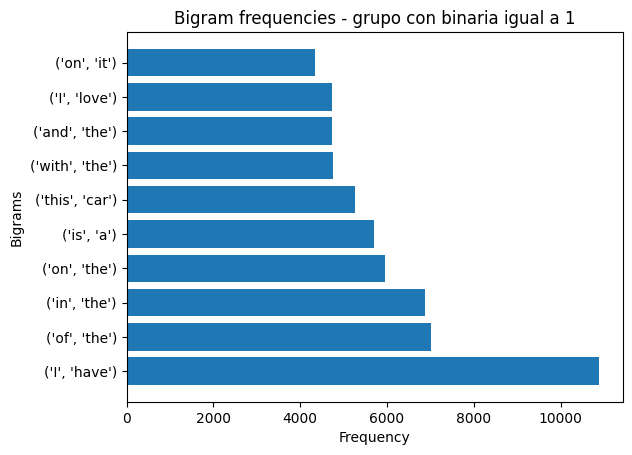

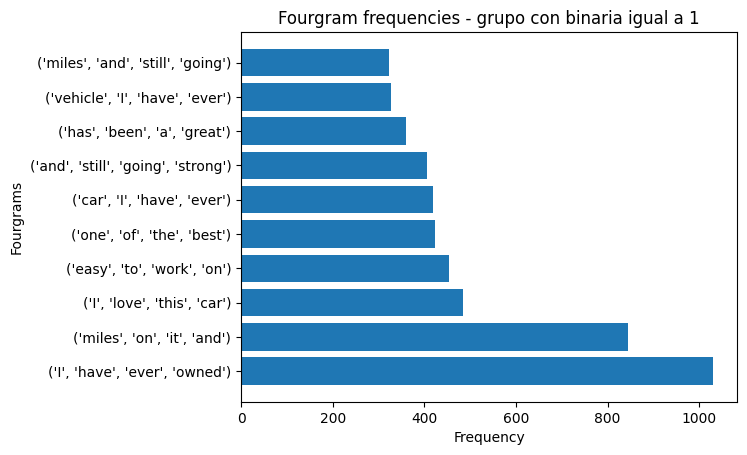

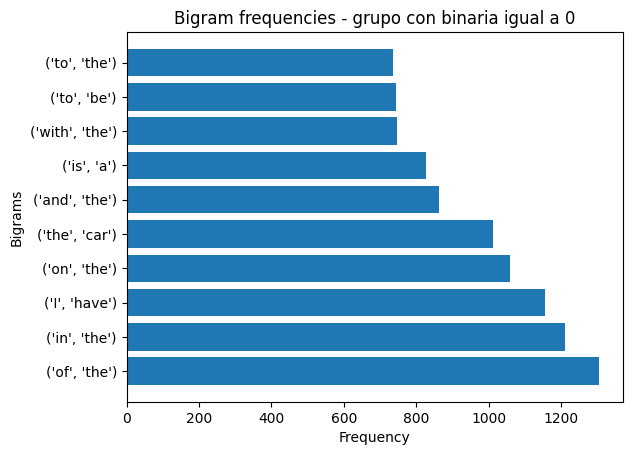

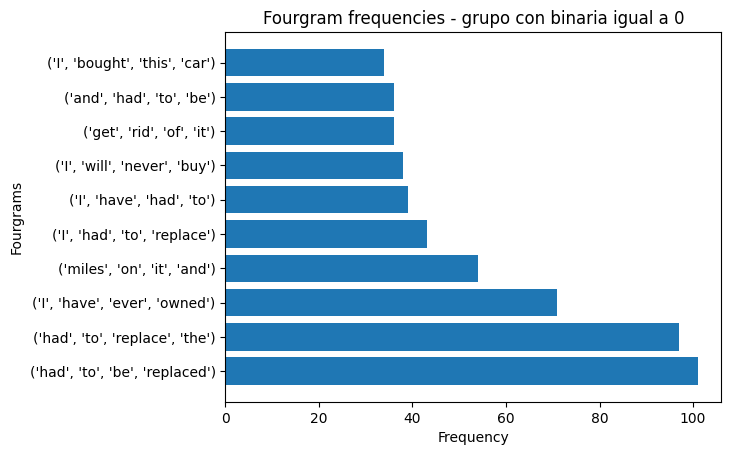

In [95]:
import pandas as pd
import re
import matplotlib.pyplot as plt
from nltk.util import ngrams
from nltk import word_tokenize
from collections import Counter
import nltk
nltk.download('punkt')

# Crear dos grupos basados en la columna 'binaria' (1 y 0)
grupo_binaria_1 = sampled_data[sampled_data['binaria'] == 1]
grupo_binaria_0 = sampled_data[sampled_data['binaria'] == 0]

# Función para generar gráficos de n-gramas
def plot_ngramas(dataframe, titulo):
    texto_completo = ' '.join(dataframe['reviewText'].astype(str))
    # Eliminar signos de puntuación utilizando una expresión regular
    texto_sin_puntuacion = re.sub(r'[^\w\s]', '', texto_completo)
    palabras = word_tokenize(texto_sin_puntuacion)  # Tokenizar el texto en palabras
    bigrams_ = list(ngrams(palabras, 2))
    cuartgrams_ = list(ngrams(palabras, 4))
    bg_freq = Counter(bigrams_)
    tg_freq = Counter(cuartgrams_)

    bg_freq_most_common = bg_freq.most_common(10)
    bgs_ = [str(bg[0]) for bg in bg_freq_most_common]
    bgs_f_ = [bg[1] for bg in bg_freq_most_common]

    tg_freq_most_common = tg_freq.most_common(10)
    tgs_ = [str(tg[0]) for tg in tg_freq_most_common]
    tgs_f_ = [tg[1] for tg in tg_freq_most_common]

    bgs_f_, bgs_ = zip(*sorted(zip(bgs_f_, bgs_)))
    tgs_f_, tgs_ = zip(*sorted(zip(tgs_f_, tgs_)))

    plt.barh(bgs_, bgs_f_)
    plt.title('Bigram frequencies - {}'.format(titulo))

    plt.xlabel('Frequency')
    plt.ylabel('Bigrams')
    plt.gca().invert_yaxis()  # Invertir el eje y para mostrar los n-gramas más frecuentes en la parte superior
    plt.show()

    plt.barh(tgs_, tgs_f_)
    plt.title('Fourgram frequencies - {}'.format(titulo))
    plt.xlabel('Frequency')
    plt.ylabel('Fourgrams')
    plt.gca().invert_yaxis()  # Invertir el eje y para mostrar los n-gramas más frecuentes en la parte superior
    plt.show()

# Mostrar los n-gramas de dos palabras para el grupo con binaria igual a 1
plot_ngramas(grupo_binaria_1, 'grupo con binaria igual a 1')


# Mostrar los n-gramas de tres palabras para el grupo con binaria igual a 0
plot_ngramas(grupo_binaria_0, 'grupo con binaria igual a 0')


aparecen valores positivos como love, car , vehicle, strong, best, great, easy en el grupo 1 y el grupo 0 car replace never buy miles on it parecen mas negativas.

---



In [96]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

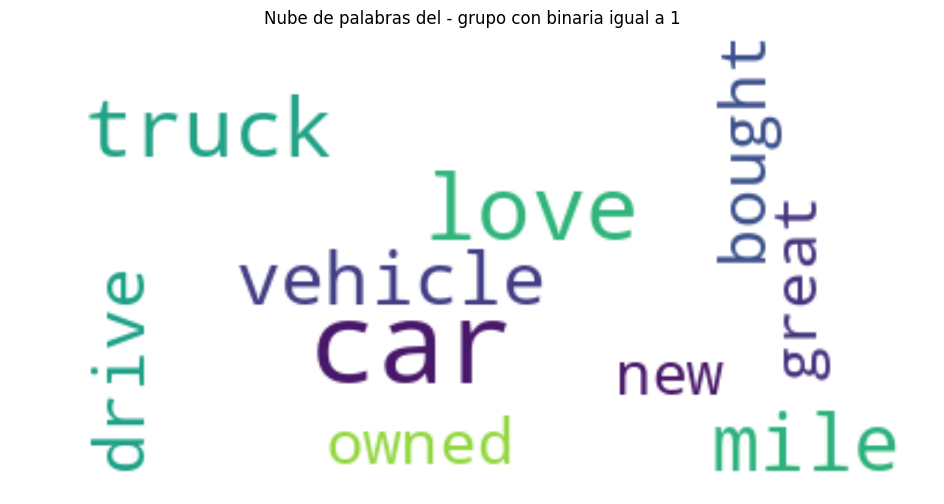

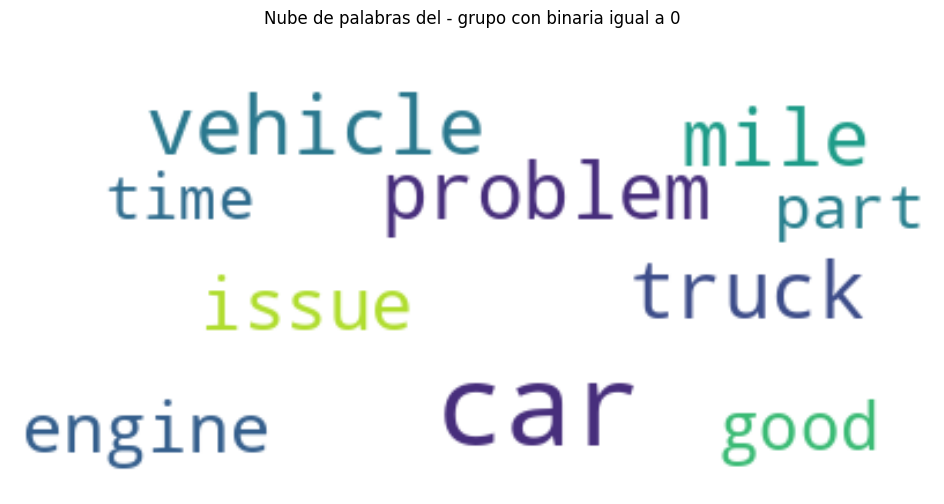

In [97]:
# Función para generar gráficos de n-gramas
def plot_word_cloud(dataframe, titulo):
    texto_completo = ' '.join(dataframe['reviewText'].astype(str))
    # Eliminar signos de puntuación utilizando una expresión regular
    texto_sin_puntuacion = re.sub(r'[^\w\s]', '', texto_completo)
    wordcloud = WordCloud(max_font_size=50, max_words=10, background_color="white").generate(texto_sin_puntuacion)
    plt.figure(figsize=(12,6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title('Nube de palabras del - {}'.format(titulo))
    plt.axis('off')
    plt.show()

plot_word_cloud(grupo_binaria_1, 'grupo con binaria igual a 1')

plot_word_cloud(grupo_binaria_0, 'grupo con binaria igual a 0')


En el grupo1 esta relacionado con love los difernetes vehiculos, pero en el grupo 0 aparece la palabra issue que es negativa pero tambien good, asi que tal vez la divicion de estrellas del 1 al 3 podria haber sido mas restricritiva

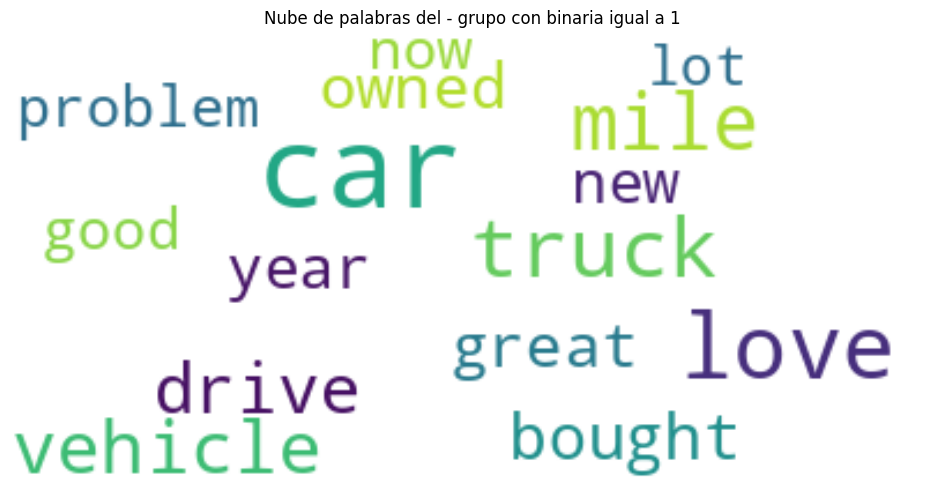

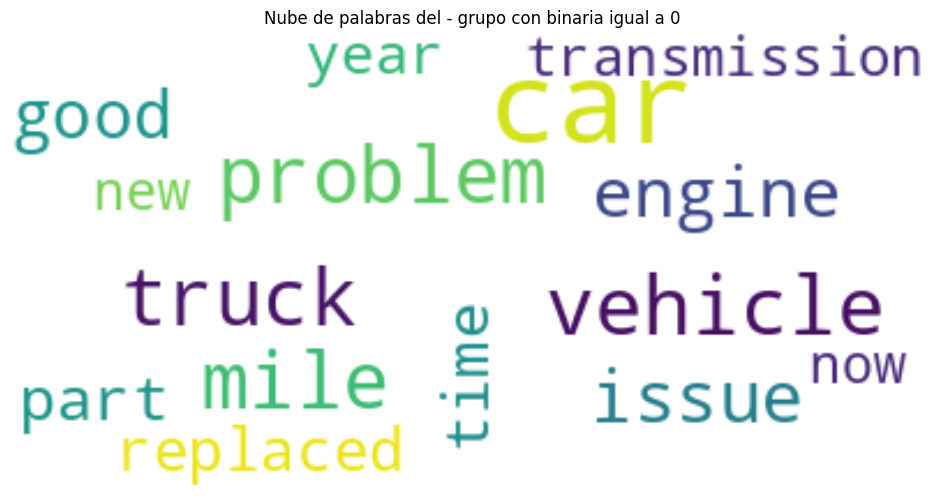

In [98]:
from wordcloud import WordCloud, STOPWORDS

# Función para generar gráficos de n-gramas
def plot_word_cloud(dataframe, titulo):
    texto_completo = ' '.join(dataframe['reviewText'].astype(str))
    # Eliminar signos de puntuación utilizando una expresión regular
    texto_sin_puntuacion = re.sub(r'[^\w\s]', '', texto_completo)
    wordcloud = WordCloud(max_font_size=50, max_words=15,  stopwords = STOPWORDS.update(['one','will','Ive', 't', 'I', 'Im']), background_color="white").generate(texto_sin_puntuacion)
    plt.figure(figsize=(12,6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title('Nube de palabras del - {}'.format(titulo))
    plt.axis('off')
    plt.show()

plot_word_cloud(grupo_binaria_1, 'grupo con binaria igual a 1')

plot_word_cloud(grupo_binaria_0, 'grupo con binaria igual a 0')


In [99]:
from gensim.models import Word2Vec
from gensim.models.word2vec import LineSentence

In [100]:
import re  # Para Preprocesamiento
import pandas as pd
from time import time  # Tiempo de las operaciones
from collections import defaultdict  # Para Frecuencias de palabras

import spacy  # Para prepocesamiento
import logging  # Configuración de loggings para monitor gensim
logging.basicConfig(format="%(levelname)s - %(asctime)s: %(message)s", datefmt= '%H:%M:%S', level=logging.INFO)
from gensim.models.phrases import Phrases, Phraser

In [101]:

nlp = spacy.load("en_core_web_sm")
def cleaning(doc):
    # Lematizamos y removemos stopwords
    # doc necesita ser a spacy Doc object
    txt = [token.lemma_ for token in doc if not token.is_stop]
    # Word2Vec usa las palabras de contexto para aprender a representar el vector de una palabra ,
    # si una sentencia tiene solo una o dos palabras ,
    # el beneficio para el training es muy pequeño
    if len(txt) > 2:
        return ' '.join(txt)

In [102]:
sampled_data.head()

,overall,reviewText,binaria
0,1.0,Wrong picture.... But great van!,0
1,1.0,This product is nothing like what it is descri...,0
2,1.0,limited dealership network....BUT lack of afte...,0
3,1.0,Defective,0
4,1.0,nothing but problems,0


In [103]:
!pip install num2words

In [104]:
import unicodedata
from num2words import num2words
import pandas as pd
from nltk import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

def nltk_cleaner(dataframe, tokenizer, sw_list, lemmatizer, output_file):
    clean_text = list()
    text = ' '.join(dataframe['reviewText'].astype(str))
    # Eliminar acentos, etc
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')

    # Separar palabras eliminando signos de puntuación
    for word in tokenizer.tokenize(text):

        # Eliminar stop words
        if word not in sw_list:

            # Eliminar espacios sobrantes, convertir a minúsculas y lematizar
            clean_word = lemmatizer.lemmatize(word).lower().strip()

            # Convertir dígitos a palabras
            if clean_word.isdigit():
                clean_word = num2words(clean_word, lang='es')

            clean_text.append(clean_word)

    clean_text = ' '.join(clean_text)

    # Guardar el texto limpio en un archivo CSV
    df = pd.DataFrame({'clean_text': [clean_text]})
    df.to_csv(output_file, index=False)

    return clean_text


In [105]:
nltk.download('stopwords')
nltk.download('wordnet')
tokenizer = RegexpTokenizer(r'\w+')
sw_list = stopwords.words('english')
lemmatizer = WordNetLemmatizer()
nltk_cleaner(sampled_data, tokenizer, sw_list, lemmatizer, './df_clean_text2.csv')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


'wrong picture but great van this product nothing like described description completely wrong buy limited dealership network but lack aftermarket part availability really destroys wallet bad car great one part start breaking money ready paid seiscientos factory radiator cause had to be dealer part defective nothing problem maintenance nightmare it never run correctly check engine light various reason time i owned this biggest piece crap car ever owned it many electrical issue ridiculous the dodge dealer cant even figure one we put cuatro set tire cuatro set brake shift driving snow impossible horrible car we never buy another dodge lose one already others louse chance getting replacement otherwise email one fob work it coded we bought truck friend bought new it noventa cero mile drove le seis month motor blew they fit jeep i dos mil cinco a4 quattro tres cero l noventa y nueve quinientos sesenta mile i replace rear coolant jumper tube ring vacuum line pvc valve intake manifold gasket i

In [106]:
import multiprocessing

from gensim.models import Word2Vec

In [107]:
cores = multiprocessing.cpu_count() # Contamos el número de cores en el ordenador

In [108]:
w2v_model = Word2Vec(min_count=20,
                     window=2,
                     #size=300,
                     sample=6e-5,
                     alpha=0.03,
                     min_alpha=0.0007,
                     negative=20,
                     workers=cores-1)

In [109]:
# Especifica la ruta al archivo CSV
ruta_archivo_csv = '/content/df_clean_text2.csv'

# Carga el archivo CSV en un DataFrame
df_clean_text = pd.read_csv(ruta_archivo_csv)

In [110]:
df_clean_text.head()

,clean_text
0,wrong picture but great van this product nothi...


In [111]:
t = time()
# Convierte los valores en la columna 'clean' a cadenas (strings)
df_clean_text['clean'] = df_clean_text['clean_text'].astype(str)

# Ahora puedes dividir los valores en la columna 'clean'
sent = [row.split() for row in df_clean_text['clean']]


w2v_model.build_vocab(sent, progress_per=10000)

print('Tiempo para construir el vocabulario: {} mins'.format(round((time() - t) / 60, 2)))
#print('Vocabulario compuesto por {} palabras'.format(len(w2v_model.wv.vocab)))


Tiempo para construir el vocabulario: 0.02 mins


In [112]:
# Obtén el tamaño del vocabulario
vocab_size = len(w2v_model.wv.key_to_index)
print('Vocabulario compuesto por {} palabras'.format(vocab_size))


Vocabulario compuesto por 4796 palabras


In [113]:
t = time()
w2v_model.train(sent, total_examples=w2v_model.corpus_count, epochs=30, report_delay=1)
print('Time to train the model: {} mins'.format(round((time() - t) / 60, 2)))
w2v_model.save('w2v_model.pkl')


Time to train the model: 0.04 mins


In [114]:
w2v_model.wv.most_similar(positive=["car"])


[('this', 0.9997351169586182),
 ('feel', 0.9997158646583557),
 ('hand', 0.9997026920318604),
 ('found', 0.9997026920318604),
 ('as', 0.9996860027313232),
 ('made', 0.9996851682662964),
 ('purchase', 0.9996824264526367),
 ('drive', 0.9996823072433472),
 ('arrived', 0.9996775388717651),
 ('owned', 0.9996755123138428)]

In [115]:
w2v_model.wv.most_similar(positive=["vehicle"])


[('sure', 0.9996970295906067),
 ('say', 0.9996741414070129),
 ('take', 0.9996729493141174),
 ('three', 0.9996693134307861),
 ('brand', 0.9996616840362549),
 ('this', 0.9996592402458191),
 ('hand', 0.9996544718742371),
 ('owned', 0.9996516704559326),
 ('yes', 0.9996479749679565),
 ('bank', 0.999646008014679)]

In [116]:
import numpy as np
from sklearn.manifold import TSNE

from gensim.models import Word2Vec
from gensim.models.word2vec import LineSentence

In [117]:
w2v_sg = Word2Vec.load('w2v_model.pkl')

In [118]:
keys = ['good','fan','replace']

embedding_clusters = []
word_clusters = []
for word in keys:
    embeddings = []
    words = []
    for similar_word, _ in w2v_sg.wv.most_similar(word, topn=10):
        words.append(similar_word)
        embeddings.append(w2v_sg.wv[similar_word])
    embedding_clusters.append(embeddings)
    word_clusters.append(words)

In [119]:
tsne_model_2d = TSNE(perplexity=15, n_components=2, init='pca', n_iter=3500, random_state=32)

In [120]:
embedding_clusters = np.array(embedding_clusters)
n, m, k = embedding_clusters.shape


In [121]:
embeddings_2d = np.array(tsne_model_2d.fit_transform(embedding_clusters.reshape(n * m, k))).reshape(n, m, 2)

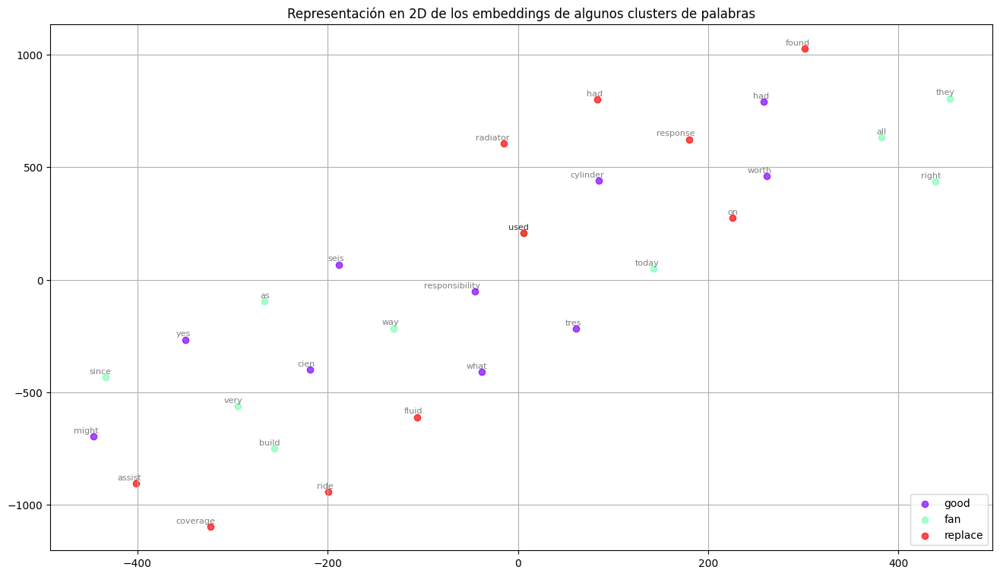

In [122]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
%matplotlib inline


def tsne_plot_similar_words(labels, embedding_clusters, word_clusters, a=0.7):
    plt.figure(figsize=(16, 9))
    colors = cm.rainbow(np.linspace(0, 1, len(labels)))
    for label, embeddings, words, color in zip(labels, embedding_clusters, word_clusters, colors):
        x = embeddings[:,0]
        y = embeddings[:,1]
        plt.scatter(x, y, c=[color], alpha=a, label=label)
        for i, word in enumerate(words):
            plt.annotate(word, alpha=0.5, xy=(x[i], y[i]), xytext=(5, 2),
                         textcoords='offset points', ha='right', va='bottom', size=8)
    plt.legend(loc=4)
    plt.grid(True)
    plt.title('Representación en 2D de los embeddings de algunos clusters de palabras')
    # plt.savefig("f/г.png", format='png', dpi=150, bbox_inches='tight')
    plt.show()


tsne_plot_similar_words(keys, embeddings_2d, word_clusters)

En el preprocesado se ha apblicado la eliminacion de signos de puntuacion y stopwork en ingles ya que como se vieron en las visualizaciones de frecuencia no aportaban informacion para el tratamiento dde los datos. De esta forma he elegido palabras que he visto que solian ser frecuentes y las he usado para ver el espacio de las palagras proyectandolo en 2D, asi he podido ver las palabras "similares" o mas cercanas en el cluster a esas palaras  key.